In [2]:
#Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(color_codes=True)
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
from numpy import mean, std
from google.colab import drive

In [3]:
#Mount google drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
#Import dataset
df = pd.read_csv('/content/drive/My Drive/Mannings Data/Mannings Data with C and Yr.csv')

In [14]:
df

,COMID,nearest_x,nearest_y,NDVI,AreaSqKM,b0_sand,AI,CAT_STRM_DENS,Forest,Agriculture,...,sinuosity,StreamOrde,D50 (mm),mean_vel_v,max_depth,SLOPE,q_va,mannings n,C,Yr
0,4289887,-69.71557,46.70053,1495,4.1301,52.0,12802,0.33,76.79,6.21,...,1.27,4,0.233105,3.333,6.509757,0.003156,9814.643,0.087557,42.125928,1.090968
1,4289887,-69.71557,46.70053,1495,4.1301,52.0,12802,0.33,76.79,6.21,...,1.27,4,0.233105,2.147,4.275734,0.003156,3906.252,0.102705,33.482915,3.175871
2,4289887,-69.71557,46.70053,1495,4.1301,52.0,12802,0.33,76.79,6.21,...,1.27,4,0.233105,1.900,5.578986,0.003156,2682.989,0.138580,25.940152,5.650299
3,4289887,-69.71557,46.70053,1495,4.1301,52.0,12802,0.33,76.79,6.21,...,1.27,4,0.233105,0.791,3.874343,0.003156,2682.989,0.261039,12.959075,15.788431
4,4289887,-69.71557,46.70053,1495,4.1301,52.0,12802,0.33,76.79,6.21,...,1.27,4,0.233105,1.900,5.578986,0.003156,2682.989,0.138580,25.940152,5.650299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67428,24270972,-122.37330,48.32399,4100,0.7533,45.0,8807,2.59,0.00,29.99,...,1.10,6,2.763152,0.670,9.592593,0.000355,1740.000,0.189102,20.806859,8.586493
67429,24270972,-122.37330,48.32399,4100,0.7533,45.0,8807,2.59,0.00,29.99,...,1.10,6,2.763152,1.860,7.131783,0.000355,3420.000,0.055903,66.990559,0.074126
67430,24270972,-122.37330,48.32399,4100,0.7533,45.0,8807,2.59,0.00,29.99,...,1.10,6,2.763152,2.150,6.870229,0.000355,3870.000,0.047173,78.895562,0.024108
67431,24270972,-122.37330,48.32399,4100,0.7533,45.0,8807,2.59,0.00,29.99,...,1.10,6,2.763152,2.680,7.662835,0.000355,5380.000,0.040701,93.119316,0.003696


#EDA

A basic EDA is below

In [ ]:
# Summary statistics for the features
print(df.describe())

              COMID     nearest_x     nearest_y          NDVI      AreaSqKM  \
count  6.743300e+04  67433.000000  67433.000000  67433.000000  67433.000000   
mean   2.585400e+07    -90.891864     38.754942   3453.822431     10.627402   
std    1.133233e+08     13.995884      5.492389   2182.015944     40.382328   
min    3.109000e+03   -124.619400     25.338670  -1377.000000      0.005400   
25%    6.128049e+06    -96.665350     34.080821   1602.000000      1.645200   
50%    1.036592e+07    -88.413230     39.601460   3900.000000      4.548600   
75%    1.754140e+07    -81.207989     42.849100   5109.000000     10.849500   
max    9.480702e+08    -67.247490     48.996370   9778.000000   7984.044900   

            b0_sand            AI  CAT_STRM_DENS        Forest   Agriculture  \
count  67433.000000  67433.000000   67433.000000  67433.000000  67433.000000   
mean      42.911279   7583.755832       0.895531     27.270671     32.546398   
std       15.588949   2924.102221       0.868107

Distribution of a few variables. Histograms visualize the frequency of data in bins, while density plots show the probability density, revealing the shape, center, and spread of the data.

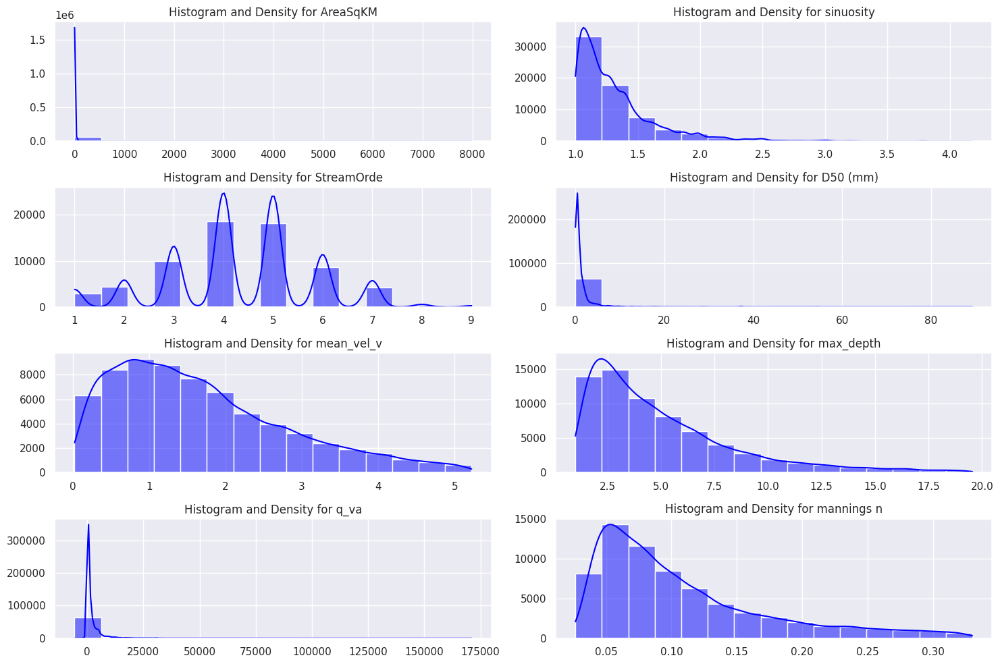

In [ ]:
# List of columns for which you want to plot histograms and KDEs
columns = ['AreaSqKM', 'sinuosity', 'StreamOrde', 'D50 (mm)', 'mean_vel_v', 'max_depth', 'q_va', 'mannings n']

# Setting up the plotting area
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 10))
axes = axes.flatten()  # Flatten the array to 1D for easy iteration

# Loop through the columns and plot histograms with KDE
for ax, column in zip(axes, columns):
    sns.histplot(df[column], bins=15, kde=True, ax=ax, color='blue')
    ax.set_title(f'Histogram and Density for {column}')
    ax.set_xlabel('')
    ax.set_ylabel('')

# Adjust layout
plt.tight_layout()
plt.show()

A heatmap with correlation value plots reveals the strength and direction of relationships between variables.  The colors show the correlation strength (red for positive, blue for negative), and the intensity reflects how strong that relationship is. Below is a heatmap for some variables.

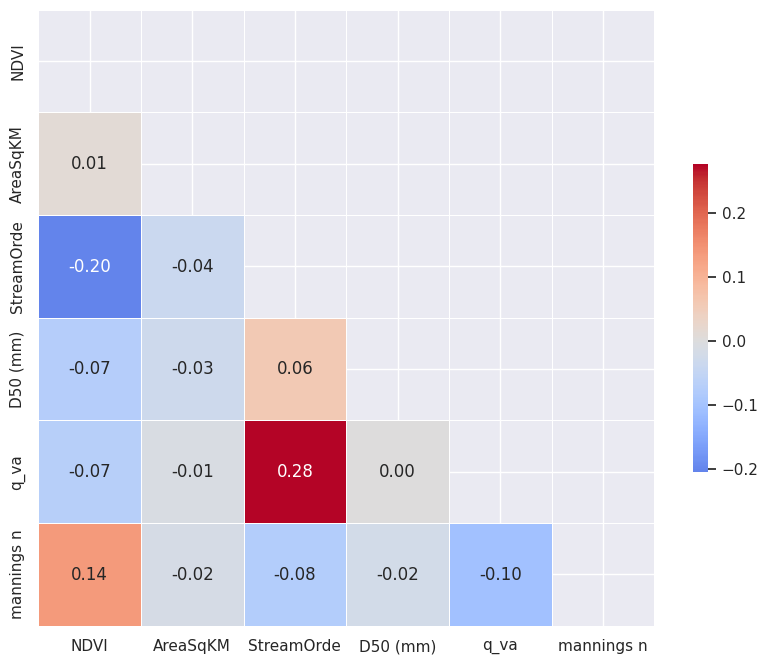

In [ ]:
corr = df[['NDVI', 'AreaSqKM', 'StreamOrde', 'D50 (mm)', 'q_va', 'mannings n']].corr()
# Mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

A pairplot, also called a scatterplot matrix, is a visualization tool used in data analysis to explore the relationships between all pairs of variables in a dataset. Below is a pairplot for all variables.

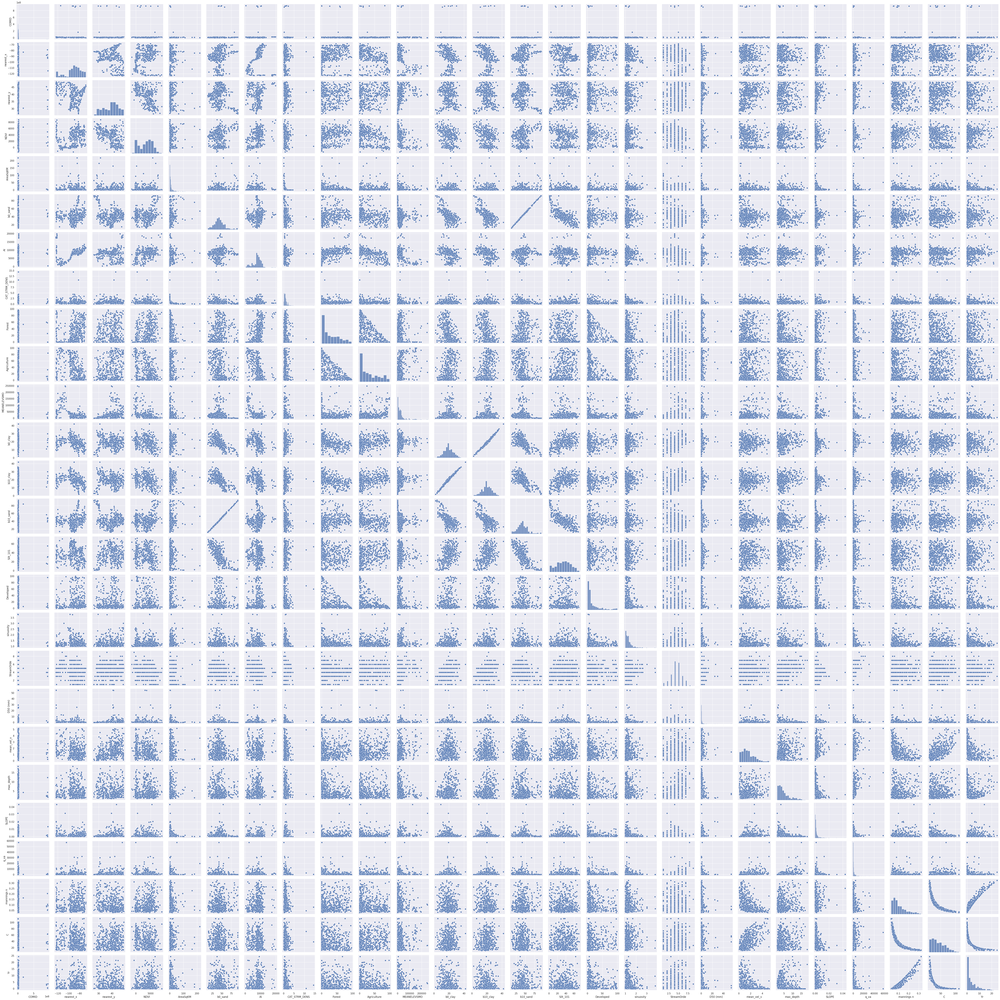

In [ ]:
#Pairplot for all all variables
sns.pairplot(df.sample(500))  # Sample can be adjusted based on dfset size
plt.show()

For more elaborated EDA, visit EDA!

#Feature Engineering

A few input features are transformed to increase the model performance.

In [ ]:
# transformations as a dictionary
transformations = {
    'b0_clay': np.log,
    'b10_clay': np.log,
    'b10_sand': np.log,
    'Silt_101': np.log,
    'Developed': np.sqrt,
    'sinuosity': np.log,
    'Forest': np.sqrt,
    'Agriculture': np.sqrt
}

# Apply transformations
for column, transform in transformations.items():
    df[f'Transformed_{column}'] = transform(df[column])

In [ ]:
# Input/output
df_xs = df[['NDVI', 'AreaSqKM', 'b0_sand', 'AI', 'CAT_STRM_DENS', 'Transformed_Forest', 'Transformed_Agriculture', 'MEANELEVSMO', 'Transformed_b0_clay', 'Transformed_b10_clay', 'Transformed_b10_sand', 'Transformed_Silt_101', 'Transformed_Developed', 'Transformed_sinuosity', 'StreamOrde', 'D50 (mm)', 'q_va', 'mannings n']]

#Input
X = df_xs[['NDVI', 'AreaSqKM', 'b0_sand', 'AI', 'CAT_STRM_DENS', 'Transformed_Forest', 'Transformed_Agriculture', 'MEANELEVSMO', 'Transformed_b0_clay', 'Transformed_b10_clay', 'Transformed_b10_sand', 'Transformed_Silt_101', 'Transformed_Developed', 'Transformed_sinuosity', 'StreamOrde', 'D50 (mm)', 'q_va']]
#Output
y = df_xs[['mannings n']]

In [ ]:
#Continuing to work with null or infinity values can lead to errors or inaccurate results in your machine learning models, as many algorithms cannot handle these values properly. This can cause issues during training, such as failing to converge or producing misleading predictions.
#Lest check for infinity values of null values before training.
# Check for infinity values
print(np.isinf(X).sum())
print(np.isinf(y).sum())
print(np.isnan(X).sum())
print(np.isnan(y).sum())

NDVI                        0
AreaSqKM                    0
b0_sand                     0
AI                          0
CAT_STRM_DENS               0
Transformed_Forest          0
Transformed_Agriculture     0
MEANELEVSMO                 0
Transformed_b0_clay         0
Transformed_b10_clay       25
Transformed_b10_sand        0
Transformed_Silt_101        0
Transformed_Developed       0
Transformed_sinuosity       0
StreamOrde                  0
D50 (mm)                    0
q_va                        0
dtype: int64
mannings n    0
dtype: int64
NDVI                       0
AreaSqKM                   0
b0_sand                    0
AI                         0
CAT_STRM_DENS              0
Transformed_Forest         0
Transformed_Agriculture    0
MEANELEVSMO                0
Transformed_b0_clay        0
Transformed_b10_clay       0
Transformed_b10_sand       0
Transformed_Silt_101       0
Transformed_Developed      0
Transformed_sinuosity      0
StreamOrde                 0
D50 (mm)     

In [ ]:
#Replace or Remove Problematic Values
# Replace infinity values with NaN
X.replace([np.inf, -np.inf], np.nan, inplace=True)
y.replace([np.inf, -np.inf], np.nan, inplace=True)
# Fill NaN values with the mean of the column
X.fillna(X.mean(), inplace=True)
y.fillna(y.mean(), inplace=True)

<ipython-input-29-c74a192c0d33>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-29-c74a192c0d33>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-29-c74a192c0d33>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)
<ipython-input-29-c74a192c0d33>:7: SettingWithCopyWarning: 
A

Feature Scalling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

def split_and_scale(X, y, test_size=0.20, random_state=42):
    """
    Splits the data into training and test sets, then scales them.

    Parameters:
    - X: Feature dataset (2D array)
    - y: Target dataset (1D array)
    - test_size: Proportion of the dataset to include in the test split (20%).
    - random_state: Seed for random number generation to ensure reproducibility.

    Returns:
    - A tuple containing scaled training and test sets: (X_train_scaled, X_test_scaled, y_train, y_test)
    """

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Initialize the StandardScaler
    scaler = StandardScaler()

    # Fit the scaler to the training data and transform it
    X_train_scaled = scaler.fit_transform(X_train)

    # Apply the same transformation to the test data
    X_test_scaled = scaler.transform(X_test)

    return X_train_scaled, X_test_scaled, y_train, y_test

In [ ]:
X_train_scaled, X_test_scaled, y_train, y_test = split_and_scale(X, y)

#Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

def linear_regression_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                                     X_test_scaled: np.ndarray, y_test: np.ndarray) -> dict:
    """
    Trains a Linear Regression model and evaluates its performance.

    Parameters:
    - X_train_scaled (np.ndarray): Scaled feature data for training.
    - y_train (np.ndarray): Target data for training.
    - X_test_scaled (np.ndarray): Scaled feature data for testing.
    - y_test (np.ndarray): Target data for testing.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Create and fit the model
        lr = LinearRegression()
        lr.fit(X_train_scaled, y_train)

        # Predictions for train and test set
        ypred_train = lr.predict(X_train_scaled)
        ypred_test = lr.predict(X_test_scaled)

        # Evaluate the model
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print the results
        print(f"Model performance for training set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for testing set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example usage:
results_lr = linear_regression_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

Model performance for training set: R² = 0.051, RMSE = 0.064
Model performance for testing set: R² = 0.052, RMSE = 0.064


The given results show the performance metrics of a machine learning model, specifically for a regression task. Here's what each metric indicates:

**R² (R-squared):**
- **Train Set:** R² of 0.051 means that only 5.1% of the variance in the target variable (y_train) can be explained by the model’s features (X_train). This indicates a weak fit, suggesting the model isn't capturing the underlying relationship well.
- **Test Set:** R² of 0.052 means that 5.2% of the variance in the target variable (y_test) can be explained by the model’s features (X_test). Again, this indicates a weak fit, suggesting the model doesn’t generalize well to unseen data.

**RMSE (Root Mean Squared Error):**
- **Train Set:** An RMSE of 0.064 indicates the average deviation between the predicted values and the actual target values in the training set is 0.064. This provides a measure of how far off the model's predictions are, in the same units as the target variable.
- **Test Set:** An RMSE of 0.064 similarly indicates the average deviation between the predicted values and the actual target values in the test set.

**Interpretation:**
- **Weak Fit:** The low R² values indicate the model explains little variance in the target variable, both on the training and test sets, suggesting it’s not effectively capturing relationships in the data.
- **Comparable Metrics:** The similarity between train and test metrics indicates the model’s performance is consistent across both datasets. This consistency suggests the model isn't overfitting, but the low scores highlight underfitting, where the model fails to capture complex patterns in the data.

Lets try non-linear models to improve the model performance.


#Polynomial Regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

def polynomial_regression_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                                         X_test_scaled: np.ndarray, y_test: np.ndarray,
                                         degree: int = 2) -> dict:
    """
    Trains a Polynomial Regression model and evaluates its performance.

    Parameters:
    - degree (int): Degree of the polynomial features.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Create a pipeline that includes polynomial features and linear regression
        poly_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

        # Fit the model to the scaled training data
        poly_model.fit(X_train_scaled, y_train)

        # Predictions for train and test set
        ypred_train = poly_model.predict(X_train_scaled)
        ypred_test = poly_model.predict(X_test_scaled)

        # Evaluate the model
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print the results
        print(f"Model performance for training set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for testing set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example of using this function with 2nd degree
results_poly2 = polynomial_regression_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test, degree=2)

Model performance for training set: R² = 0.119, RMSE = 0.062
Model performance for testing set: R² = 0.109, RMSE = 0.062


In [ ]:
#3rd degree
results_ploy3 = polynomial_regression_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test, degree=3)

Model performance for training set: R² = 0.276, RMSE = 0.056
Model performance for testing set: R² = -0.196, RMSE = 0.072


Performance dropped in case of degree 3 for test set. But the model learns more (overfit) in the training phase.

#SVR

Support Vector Regression (SVR) could potentially improve performance by capturing more complex relationships between the features and the target variable through its kernel functions, such as the radial basis function (RBF). This allows SVR to model non-linear patterns in the data, which a simple linear regression might miss. Additionally, SVR is robust to outliers, which can lead to better generalization on unseen data. Lets try this.

In [ ]:
from sklearn.svm import SVR

def svr_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                       X_test_scaled: np.ndarray, y_test: np.ndarray,
                       kernel='rbf', C=2.0, gamma='scale', epsilon=0.1) -> dict:
    """
    Trains a Support Vector Regression (SVR) model and evaluates its performance.

    Parameters:
    - kernel (str): Type of the kernel to be used in the algorithm.
    - C (float): Regularization parameter.
    - gamma (str or float): Kernel coefficient.
    - epsilon (float): Epsilon in the epsilon-SVR model.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Initialize the SVR model with the specified parameters
        svr = SVR(kernel=kernel, C=C, gamma=gamma, epsilon=epsilon)

        # Fit the model on the scaled training data
        svr.fit(X_train_scaled, y_train)

        # Prediction for the training and test sets
        ypred_train = svr.predict(X_train_scaled)
        ypred_test = svr.predict(X_test_scaled)

        # Model Evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"Model performance for train set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
results_svr = svr_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model performance for train set: R² = -0.048, RMSE = 0.067
Model performance for test set: R² = -0.062, RMSE = 0.068


#KNN

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

def knn_regression_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                                  X_test_scaled: np.ndarray, y_test: np.ndarray,
                                  n_neighbors=5, weights='uniform') -> dict:
    """
    Trains a K-Nearest Neighbors (KNN) Regression model and evaluates its performance.

    Parameters:
    - n_neighbors (int): Number of neighbors to use for k-neighbors queries.
    - weights (str): Weight function used in prediction.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Create the KNN regression model instance with specified hyperparameters
        knn = KNeighborsRegressor(n_neighbors=n_neighbors, weights=weights)

        # Train the model on the scaled training data
        knn.fit(X_train_scaled, y_train)

        # Predictions for the training and test sets
        ypred_train = knn.predict(X_train_scaled)
        ypred_test = knn.predict(X_test_scaled)

        # Model evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"Model performance for train set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example usage:
results_knn = knn_regression_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

Model performance for train set: R² = 0.731, RMSE = 0.034
Model performance for test set: R² = 0.591, RMSE = 0.042


The SVM model's performance is as follows: on the training set, it has an R² of -0.05 and an RMSE of 0.07; on the test set, it has an R² of -0.06 and an RMSE of 0.07. This indicates that it performs worse than a simple mean model, showing significant underfitting and poor predictive power.

The KNN model's performance is as follows: on the training set, it has an R² of 0.73 and an RMSE of 0.03; on the test set, it has an R² of 0.59 and an RMSE of 0.04. This indicates that it provides a better fit and generalizes moderately well, outperforming SVM significantly.

In conclusion, KNN outperforms SVM on both sets, suggesting it is better suited to the dataset's relationships, while SVM needs refinement to avoid underfitting.

#Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

def gbm_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                       X_test_scaled: np.ndarray, y_test: np.ndarray,
                       n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0) -> dict:
    """
    Trains a Gradient Boosting Machine (GBM) model and evaluates its performance.

    Parameters:
    - n_estimators (int): The number of boosting stages to perform.
    - learning_rate (float): Learning rate shrinks the contribution of each tree.
    - max_depth (int): Maximum depth of the individual regression estimators.
    - random_state (int): Controls the randomness of the bootstrapping of the samples for building trees.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Create the GBM model with default hyperparameters
        gbm = GradientBoostingRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                                        max_depth=max_depth, random_state=random_state)

        # Fit the model to the scaled training data
        gbm.fit(X_train_scaled, y_train)

        # Predictions for the training and test sets
        ypred_train = gbm.predict(X_train_scaled)
        ypred_test = gbm.predict(X_test_scaled)

        # Model Evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"GBM model performance for training set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"GBM model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example usage:
results_gbm = gbm_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GBM model performance for training set: R² = 0.254, RMSE = 0.057
GBM model performance for test set: R² = 0.249, RMSE = 0.057


#AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

# Assuming X_train_scaled, X_test_scaled, y_train, and y_test are defined earlier
def adaboost_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                            X_test_scaled: np.ndarray, y_test: np.ndarray,
                            base_depth=4, n_estimators=50, learning_rate=0.01, random_state=0) -> dict:
    """
    Trains an AdaBoost model with a Decision Tree as the base estimator and evaluates its performance.

    Parameters:
    - base_depth (int): Maximum depth of the individual Decision Tree estimators.
    - n_estimators (int): The maximum number of estimators at which boosting is terminated.
    - learning_rate (float): Weight applied to each classifier at each boosting iteration.
    - random_state (int): Controls both the randomness of the bootstrapping of the samples and the sampling of the features.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Create an AdaBoost model with a Decision Tree as the base estimator
        adaboost = AdaBoostRegressor(
            base_estimator=DecisionTreeRegressor(max_depth=base_depth),
            n_estimators=n_estimators,
            learning_rate=learning_rate,
            random_state=random_state
        )

        # Fit the model to the training data
        adaboost.fit(X_train_scaled, y_train)

        # Predict on the training and test sets
        ypred_train = adaboost.predict(X_train_scaled)
        ypred_test = adaboost.predict(X_test_scaled)

        # Evaluate the model's performance
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"AdaBoost model performance for training set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"AdaBoost model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example usage:
results_adaboost = adaboost_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoost model performance for training set: R² = 0.134, RMSE = 0.061
AdaBoost model performance for test set: R² = 0.135, RMSE = 0.061


#Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

def random_forest_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                                 X_test_scaled: np.ndarray, y_test: np.ndarray,
                                 n_estimators=100, min_samples_split=6, min_samples_leaf=1,
                                 max_features='sqrt', max_depth=99, bootstrap=True, random_state=0) -> dict:
    """
    Trains a RandomForest Regressor model and evaluates its performance.

    Parameters:
    - n_estimators (int): The number of trees in the forest.
    - min_samples_split (int): The minimum number of samples required to split an internal node.
    - min_samples_leaf (int): The minimum number of samples required to be at a leaf node.
    - max_features (str or int): The number of features to consider when looking for the best split.
    - max_depth (int): The maximum depth of the tree.
    - bootstrap (bool): Whether bootstrap samples are used when building trees.
    - random_state (int): Controls both the randomness of the bootstrapping of the samples and the sampling of the features.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Initialize the RandomForest Regressor model with specified parameters
        rf = RandomForestRegressor(n_estimators=n_estimators, min_samples_split=min_samples_split,
                                   min_samples_leaf=min_samples_leaf, max_features=max_features,
                                   max_depth=max_depth, bootstrap=bootstrap, random_state=random_state)

        # Fit the model to the scaled training data
        rf.fit(X_train_scaled, y_train)

        # Prediction for the training and test sets
        ypred_train = rf.predict(X_train_scaled)
        ypred_test = rf.predict(X_test_scaled)

        # Model Evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"Model performance for train set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example usage:
results_rf = random_forest_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

<ipython-input-20-1feb8a508203>:30: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train_scaled, y_train)


Model performance for train set: R² = 0.857, RMSE = 0.025
Model performance for test set: R² = 0.671, RMSE = 0.038


So far, Random Forest has performed best compared to the models mentioned above with default hyperparameters. However, hyperparameter tuning can significantly increase the model's performance.

#XGBoost

In [ ]:
from xgboost import XGBRegressor

def xgb_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                       X_test_scaled: np.ndarray, y_test: np.ndarray,
                       n_estimators=100, max_depth=10, eta=0.1, subsample=0.7,
                       colsample_bytree=0.8, random_state=0) -> dict:
    """
    Trains an XGBRegressor model and evaluates its performance.

    Parameters:
    - n_estimators (int): Number of gradient boosted trees.
    - max_depth (int): Maximum tree depth for base learners.
    - eta (float): Step size shrinkage used to prevent overfitting.
    - subsample (float): Subsample ratio of the training instances.
    - colsample_bytree (float): Subsample ratio of columns when constructing each tree.
    - random_state (int): Random number seed.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Initialize the XGBRegressor model with specified parameters
        xgb = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, eta=eta,
                           subsample=subsample, colsample_bytree=colsample_bytree,
                           random_state=random_state)

        # Fit the model to the scaled training data
        xgb.fit(X_train_scaled, y_train)

        # Prediction for the training and test sets
        ypred_train = xgb.predict(X_train_scaled)
        ypred_test = xgb.predict(X_test_scaled)

        # Model Evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"Model performance for train set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
results_xgb = xgb_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

Model performance for train set: R² = 0.791, RMSE = 0.030
Model performance for test set: R² = 0.648, RMSE = 0.039


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

def neural_network_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                                  X_test_scaled: np.ndarray, y_test: np.ndarray,
                                  epochs=100, batch_size=32) -> dict:
    """
    Trains a simple neural network model and evaluates its performance.

    Parameters:
    - epochs (int): Number of epochs to train the model.
    - batch_size (int): Batch size for the training.

    Returns:
    - dict: A dictionary with MSE and R-squared for the test set.
    """

    try:
        # Define the model
        model = Sequential([
            Dense(32, activation='relu', input_shape=(X_train_scaled.shape[1],)),
            Dense(1)
        ])
        model.compile(loss='mean_squared_error', optimizer='adam')

        # Fit the model
        model.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        # Predict using the scaled test data
        y_pred = model.predict(X_test_scaled)

        # Evaluate the model using the test data
        test_mse = model.evaluate(X_test_scaled, y_test, verbose=0)

        # Calculate R^2 score
        r2_test = r2_score(y_test, y_pred.flatten())  # Flatten to ensure proper shape matching

        # Compile results
        results = {
            'MSE Test': test_mse,
            'R2 Test': r2_test
        }

        # Print model performance metrics
        print(f"Test MSE: {test_mse:.3f}")
        print(f"R^2 Score: {r2_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Example usage:
nn_results = neural_network_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)

422/422 [==============================] - 1s 1ms/step
Test MSE: 0.003
R^2 Score: 0.240


#Histogram-based Gradient Boosting Regression Tree (HGBRT)

In [ ]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor

def hgbrt_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                         X_test_scaled: np.ndarray, y_test: np.ndarray,
                         learning_rate=0.1, max_iter=10000, max_leaf_nodes=300,
                         max_depth=None, min_samples_leaf=20, l2_regularization=0.0,
                         max_bins=255, random_state=0) -> dict:
    """
    Trains a HistGradientBoostingRegressor model and evaluates its performance.

    Parameters:
    - learning_rate (float): Learning rate shrinks the contribution of each tree.
    - max_iter (int): The maximum number of iterations of the boosting process.
    - max_leaf_nodes (int): The maximum number of leaves for each tree.
    - max_depth (int or None): The maximum depth of each tree.
    - min_samples_leaf (int): The minimum number of samples per leaf.
    - l2_regularization (float): L2 regularization parameter.
    - max_bins (int): The maximum number of bins to use for non-missing values.
    - random_state (int): Random seed.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Initialize the HistGradientBoostingRegressor model with specified parameters
        model_hgbrt = HistGradientBoostingRegressor(
            learning_rate=learning_rate, max_iter=max_iter, max_leaf_nodes=max_leaf_nodes,
            max_depth=max_depth, min_samples_leaf=min_samples_leaf, l2_regularization=l2_regularization,
            max_bins=max_bins, random_state=random_state
        )

        # Fit the model to the training data
        model_hgbrt.fit(X_train_scaled, y_train)

        # Prediction for the training and test sets
        ypred_train = model_hgbrt.predict(X_train_scaled)
        ypred_test = model_hgbrt.predict(X_test_scaled)

        # Model Evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"Model performance for train set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Train and evaluate the model
results_hgbrt = hgbrt_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)
print(results_hgbrt)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model performance for train set: R² = 0.849, RMSE = 0.026
Model performance for test set: R² = 0.665, RMSE = 0.038
{'R2 Train': 0.8486063593467807, 'RMSE Train': 0.025514048858072548, 'R2 Test': 0.6654302370643199, 'RMSE Test': 0.03820240847620536}


Reference: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.HistGradientBoostingRegressor.html

#Voting Regressor (VR)

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, VotingRegressor
from xgboost import XGBRegressor

def voting_regressor_train_evaluate(X_train_scaled: np.ndarray, y_train: np.ndarray,
                                    X_test_scaled: np.ndarray, y_test: np.ndarray) -> dict:

    """
    Trains a VotingRegressor model with GradientBoostingRegressor, RandomForestRegressor,
    and XGBRegressor and evaluates its performance.

    Returns:
    - dict: A dictionary with R-squared and RMSE for both the train and test sets.
    """

    try:
        # Initialize individual models
        reg1 = GradientBoostingRegressor(n_estimators=100, max_depth=10, subsample=0.7)
        reg2 = RandomForestRegressor(n_estimators=1000, min_samples_split=10, min_samples_leaf=1,
                                     max_features='sqrt', max_depth=100, bootstrap=True, random_state=0)
        reg3 = XGBRegressor(n_estimators=100, max_depth=10, eta=0.1, subsample=0.7, colsample_bytree=0.8)

        # Initialize the VotingRegressor with the individual models
        model_vr = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2), ('xgb', reg3)])

        # Fit the model to the training data
        model_vr = model_vr.fit(X_train_scaled, y_train)

        # Prediction for the training and test sets
        ypred_train = model_vr.predict(X_train_scaled)
        ypred_test = model_vr.predict(X_test_scaled)

        # Model Evaluation
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Compile results
        results = {
            'R2 Train': r2_train,
            'RMSE Train': rmse_train,
            'R2 Test': r2_test,
            'RMSE Test': rmse_test
        }

        # Print model performance metrics
        print(f"Model performance for train set: R² = {r2_train:.3f}, RMSE = {rmse_train:.3f}")
        print(f"Model performance for test set: R² = {r2_test:.3f}, RMSE = {rmse_test:.3f}")

        return results
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return {}

In [ ]:
# Train and evaluate the model
results_vr = voting_regressor_train_evaluate(X_train_scaled, y_train, X_test_scaled, y_test)
print(results_vr)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_voting.py:597: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model performance for train set: R² = 0.813, RMSE = 0.028
Model performance for test set: R² = 0.664, RMSE = 0.038
{'R2 Train': 0.813024642383961, 'RMSE Train': 0.028354223131941095, 'R2 Test': 0.6644791726304082, 'RMSE Test': 0.038256667964344404}


Reference: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingRegressor.html

#Automated Regression Models

For Automated Regression Models, four models have been used such as linear regression, SVM, KNN and Randomm Forest.

In [ ]:
def train_and_evaluate_regression_models(X_train_scaled, y_train, X_test_scaled, y_test):
    """
    Train and evaluate multiple regression models, returning performance metrics.

    Parameters:
    - X_train_scaled: Training feature data
    - y_train: Training target data
    - X_test_scaled: Test feature data
    - y_test: Test target data

    Returns:
    - A dictionary with model names as keys and metrics (R², RMSE) as values
    """
    # Initialize models
    models = {
        'Linear Regression': LinearRegression(),
        'SVM': SVR(kernel='rbf'),
        'KNN': KNeighborsRegressor(n_neighbors=5),
        'Random Forest': RandomForestRegressor(n_estimators=100, min_samples_split=6, random_state=0)
    }

    results = {}

    for model_name, model in models.items():
        # Train the model
        model.fit(X_train_scaled, y_train)

        # Make predictions
        ypred_train = model.predict(X_train_scaled)
        ypred_test = model.predict(X_test_scaled)

        # Evaluate performance
        r2_train = r2_score(y_train, ypred_train)
        rmse_train = sqrt(mean_squared_error(y_train, ypred_train))
        r2_test = r2_score(y_test, ypred_test)
        rmse_test = sqrt(mean_squared_error(y_test, ypred_test))

        # Store results
        results[model_name] = {
            'R² Train': r2_train,
            'RMSE Train': rmse_train,
            'R² Test': r2_test,
            'RMSE Test': rmse_test
        }

    return results

In [ ]:
# Example usage:
results = train_and_evaluate_regression_models(X_train_scaled, y_train, X_test_scaled, y_test)
for model, metrics in results.items():
    print(f"{model} performance:")
    print(f"  R² Train: {metrics['R² Train']:.3f}, RMSE Train: {metrics['RMSE Train']:.3f}")
    print(f"  R² Test: {metrics['R² Test']:.3f}, RMSE Test: {metrics['RMSE Test']:.3f}")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
<ipython-input-24-93cf8de140be>:26: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train_scaled, y_train)


Linear Regression performance:
  R² Train: 0.051, RMSE Train: 0.064
  R² Test: 0.052, RMSE Test: 0.064
SVM performance:
  R² Train: -0.083, RMSE Train: 0.068
  R² Test: -0.091, RMSE Test: 0.069
KNN performance:
  R² Train: 0.731, RMSE Train: 0.034
  R² Test: 0.591, RMSE Test: 0.042
Random Forest performance:
  R² Train: 0.879, RMSE Train: 0.023
  R² Test: 0.667, RMSE Test: 0.038


The provided function automates model training, evaluation, and comparison for four models: Linear Regression, SVM, KNN, and Random Forest. It offers a streamlined workflow, handling model fitting, prediction, and evaluation in a single function. However, it lacks broader automation features typical of a full AutoML solution, such as comprehensive data preprocessing, hyperparameter tuning, and ensemble learning. To achieve complete automation, consider integrating these additional steps.

# Unsupervised

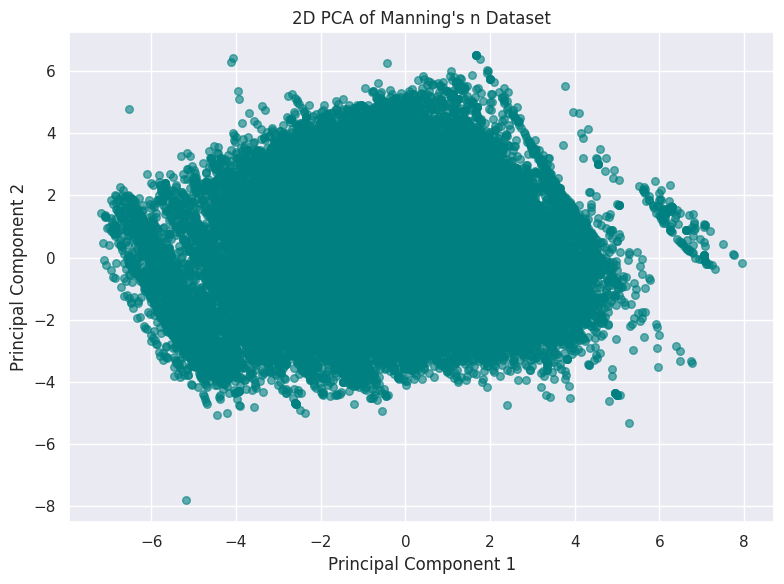

In [15]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# --- Select Features (exclude non-numeric or identifiers) ---
features = df.drop(columns=['COMID', 'nearest_x', 'nearest_y'])  # adjust if needed

# --- Drop NaNs ---
features = features.dropna()

# --- Standardize ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# --- PCA to 2D ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# --- Create a DataFrame for PCA results ---
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])

# --- Plot ---
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.6, s=30, color='teal')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA of Manning\'s n Dataset')
plt.grid(True)
plt.tight_layout()
plt.show()

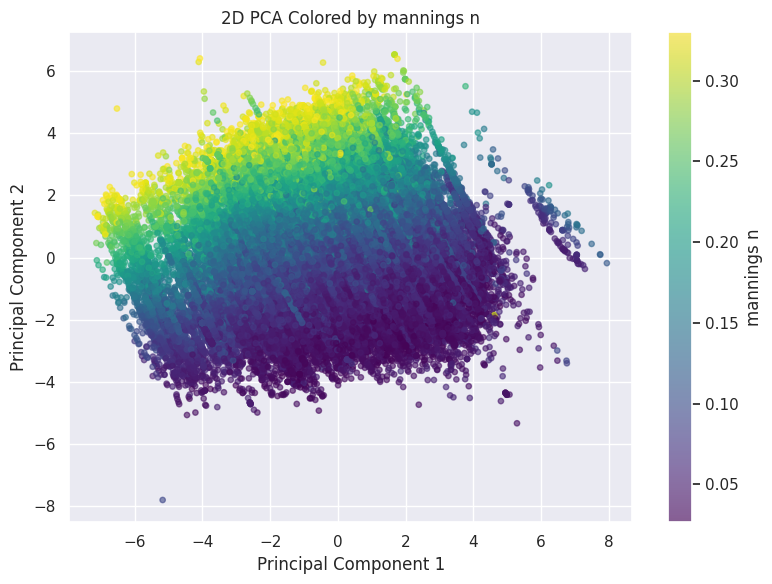

In [11]:
# Optional: define groups (e.g., using StreamOrde if available)
group_col = df.loc[features.index, 'mannings n']  # align index if features were cleaned

plt.figure(figsize=(8, 6))
scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], c=group_col, cmap='viridis', alpha=0.6, s=15)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Colored by mannings n')
plt.colorbar(scatter, label='mannings n')
plt.grid(True)
plt.tight_layout()
plt.show()

In [16]:
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=features.columns)
print(loadings.sort_values('PC2', ascending=False))

                    PC1       PC2
mannings n    -0.195953  0.479685
Yr            -0.202647  0.465102
b10_clay       0.361441  0.191280
b0_clay        0.358733  0.187163
Silt_101       0.270960  0.168583
SLOPE         -0.065813  0.127527
CAT_STRM_DENS  0.024427  0.105222
Agriculture    0.235240  0.060557
D50 (mm)       0.060017  0.023751
MEANELEVSMO    0.124189  0.016071
StreamOrde     0.169104 -0.006046
NDVI          -0.224970 -0.010970
Developed     -0.005357 -0.019747
sinuosity      0.073930 -0.024834
AreaSqKM      -0.012228 -0.037432
Forest        -0.191064 -0.038944
max_depth      0.108685 -0.049389
AI            -0.206982 -0.050716
q_va           0.118682 -0.124985
b0_sand       -0.349293 -0.210194
b10_sand      -0.349629 -0.211225
mean_vel_v     0.170630 -0.313699
C              0.212224 -0.458040


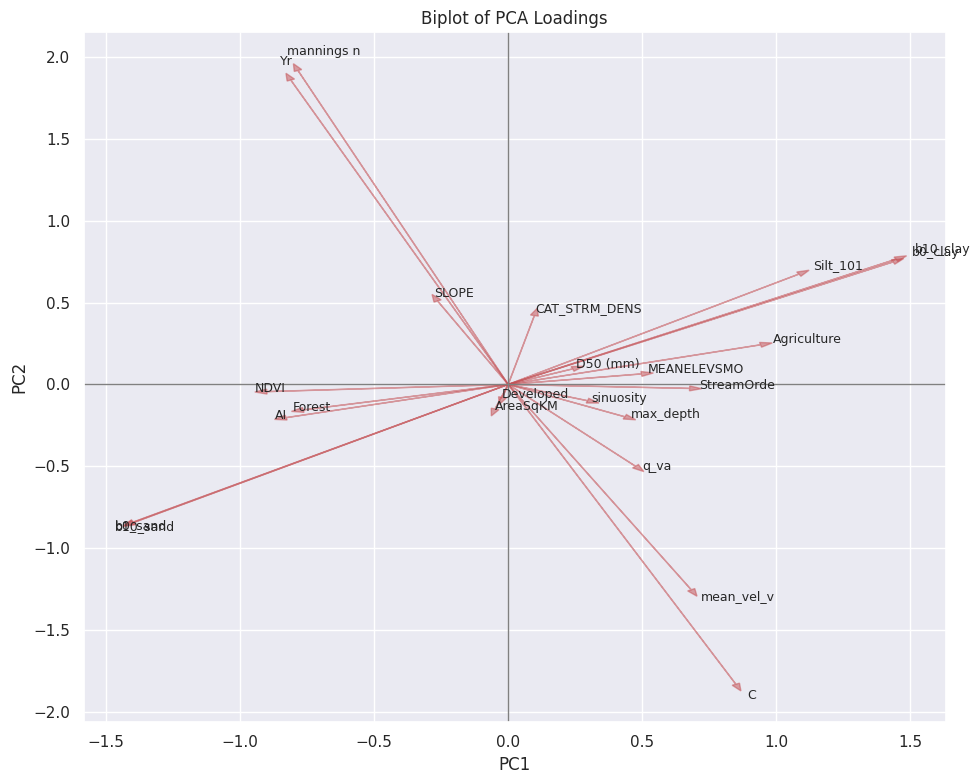

In [17]:
# Plot biplot
plt.figure(figsize=(10, 8))
for i in range(loadings.shape[0]):
    plt.arrow(0, 0,
              loadings.iloc[i, 0] * 4,  # scale up for better visibility
              loadings.iloc[i, 1] * 4,
              color='r', alpha=0.5, head_width=0.03)
    plt.text(loadings.iloc[i, 0] * 4.2,
             loadings.iloc[i, 1] * 4.2,
             loadings.index[i], fontsize=9)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Biplot of PCA Loadings')
plt.grid(True)
plt.axhline(0, color='gray', lw=1)
plt.axvline(0, color='gray', lw=1)
plt.tight_layout()
plt.show()